# Analysis of Greedy (+ Not So Greedy) Routing
[ How to Insert DateTime? 18th January 2018]

Firstly, we want to start by noting all csv files contained within the `./data_output` directory, and list them all out. 

Then, we want to parse out the p, alpha, N, and dim variables from the
csv name.

Finally, we want to add all of this to a dataframe, let's call it df.

    

In [14]:
library(readr)
suppressPackageStartupMessages(library(dplyr))

filenames <- list.files("./data_output", pattern="*.csv", full.names=TRUE)
stripped_filenames <- substr(filenames,19, nchar(filenames)-4)
split_strip_filenames <- strsplit(stripped_filenames, "_")
seq <- seq_along(filenames)

temp <- 2
getelt <- function(x) {
  list_temp <- split_strip_filenames[[x]]
  return(split_strip_filenames[[x]][temp])
}

pvector <- lapply(seq, getelt)
temp <- 4
avector <- lapply(seq, getelt)
temp <- 6
nvector <- lapply(seq, getelt)
temp <- 8
dvector <- lapply(seq, getelt)
df <- data_frame(p = as.numeric(pvector),
           alpha = as.numeric(avector),
           N = as.integer(nvector),
           dim = as.integer(dvector),
           filename = filenames)
rm(pvector, avector, nvector, dvector, temp, split_strip_filenames, stripped_filenames, getelt,
   seq, filenames)
df

p,alpha,N,dim,filename
1,0.0,100,1,./data_output/sim_p_1_alpha_0.0_N_100_dim_1_test.csv
1,0.0,100,1,./data_output/sim_p_1_alpha_0.0_N_100_dim_1.csv
1,0.5,100,1,./data_output/sim_p_1_alpha_0.5_N_100_dim_1_test.csv
1,0.5,100,1,./data_output/sim_p_1_alpha_0.5_N_100_dim_1.csv
1,1.0,100,1,./data_output/sim_p_1_alpha_1.0_N_100_dim_1_test.csv
1,1.0,100,1,./data_output/sim_p_1_alpha_1.0_N_100_dim_1.csv
1,1.5,100,1,./data_output/sim_p_1_alpha_1.5_N_100_dim_1_test.csv
1,1.5,100,1,./data_output/sim_p_1_alpha_1.5_N_100_dim_1.csv
1,2.0,100,1,./data_output/sim_p_1_alpha_2.0_N_100_dim_1_test.csv
1,2.0,100,1,./data_output/sim_p_1_alpha_2.0_N_100_dim_1.csv


## Graphing Simulation Run Data

### Routed Path Length Across Simulation
The below code graphs the he routed path length, for each of the three routing strategies
K1, K2 and SP. The routed path length is shown, with one graph per unique N and alpha value combination (ie once per call to  `runSimulation` in `greedy_path_test.py`. No pattern should
be discernable for the routed path length across the x axis. Over the y
axis, one can see that, generally speaking, SP < K2 < K1."

Note that the x axis corresponds to the time the routing strategy was called 
for the given N and alpha values. IE 1000 would correspond to the 1000th call.

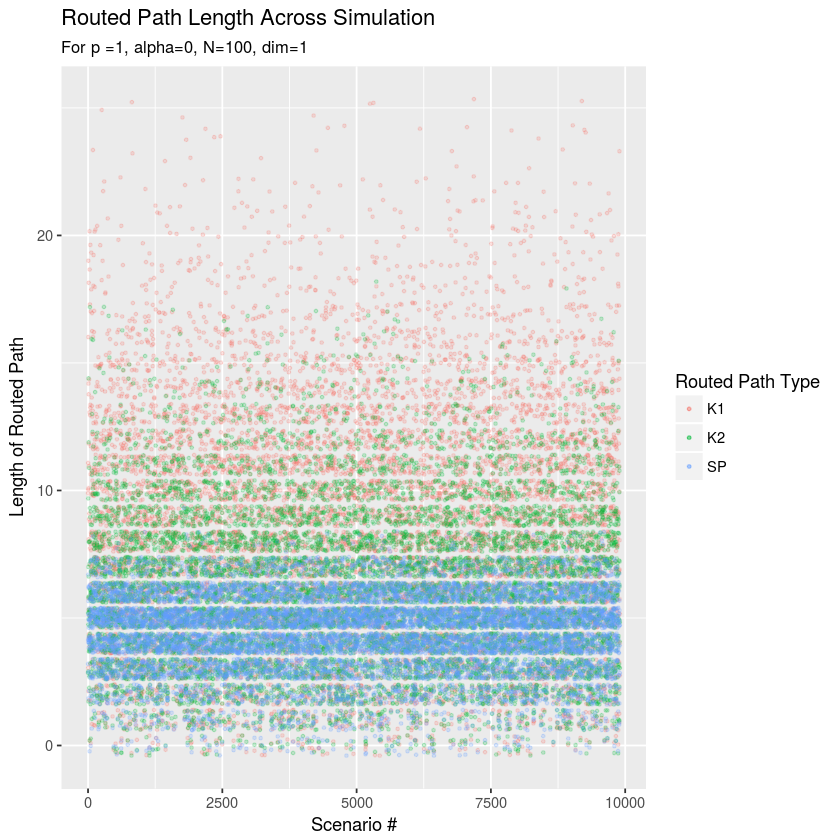

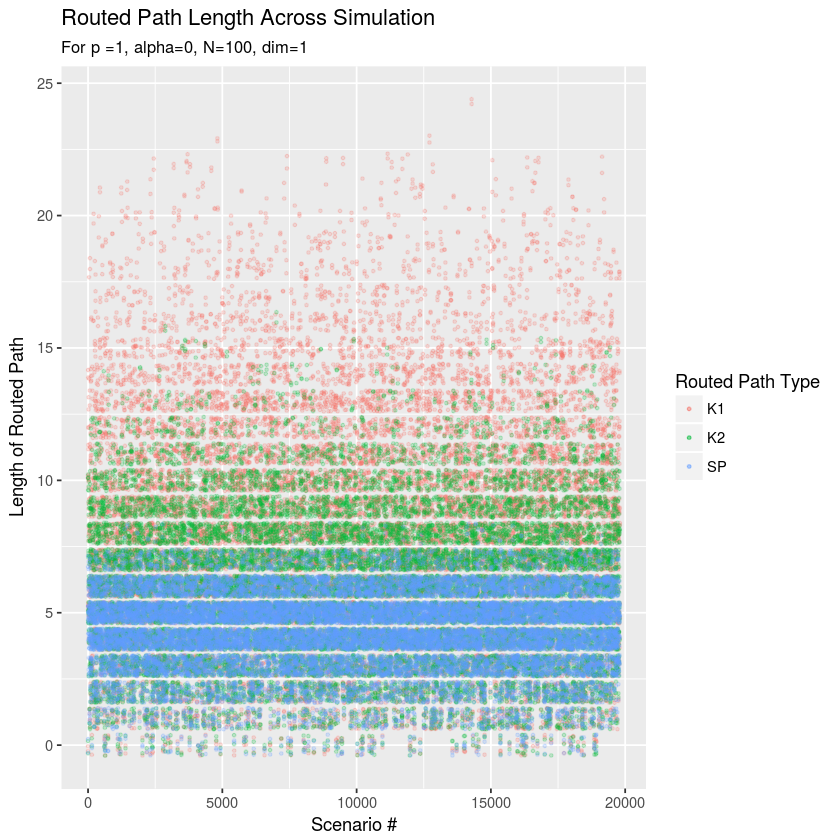

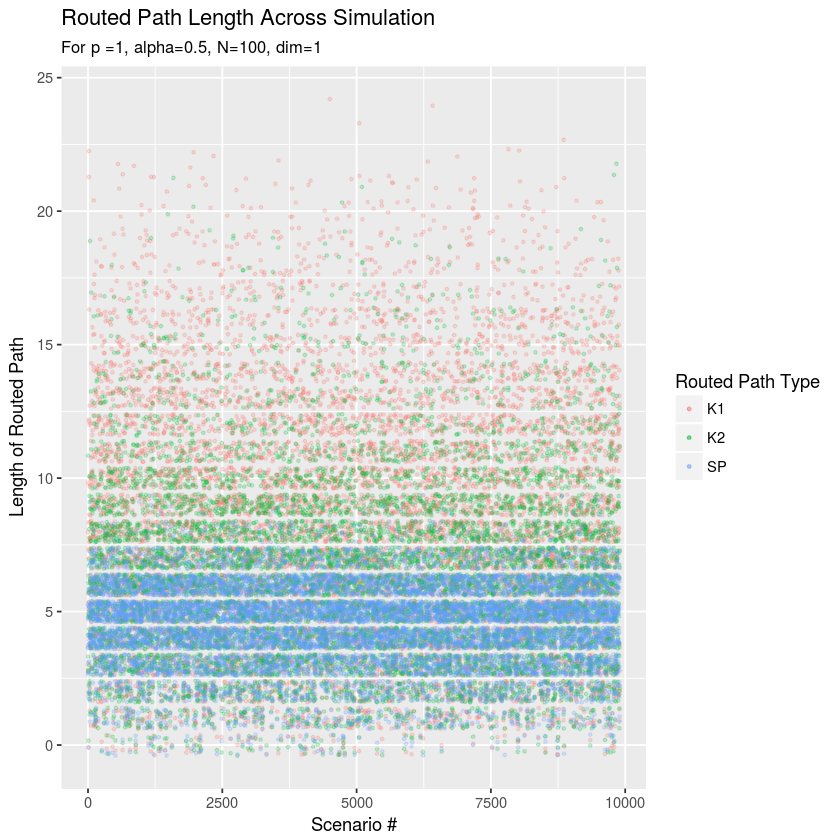

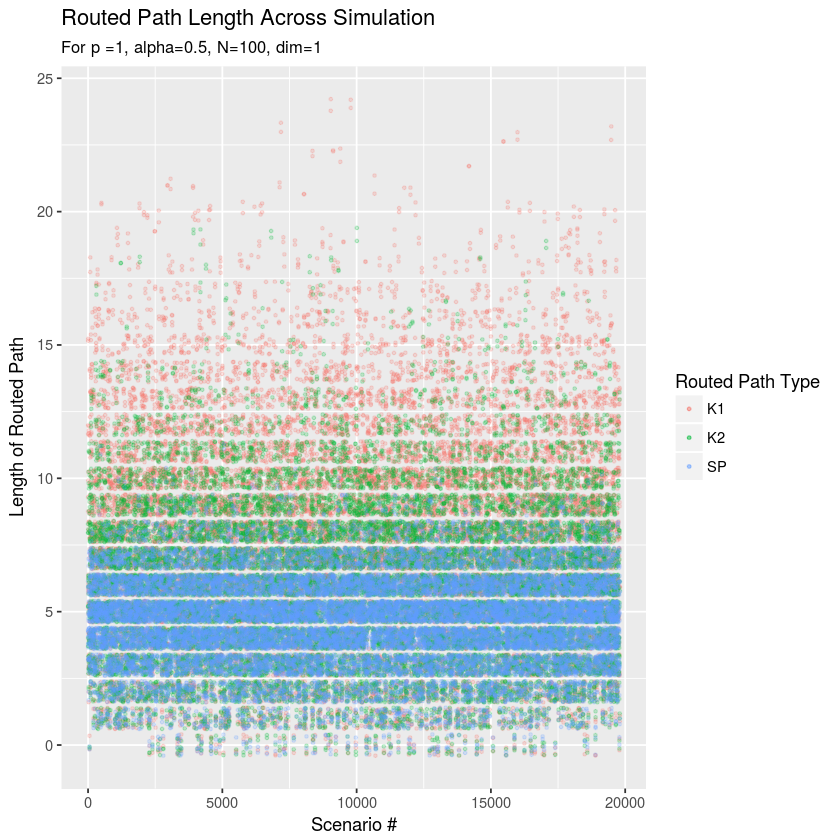

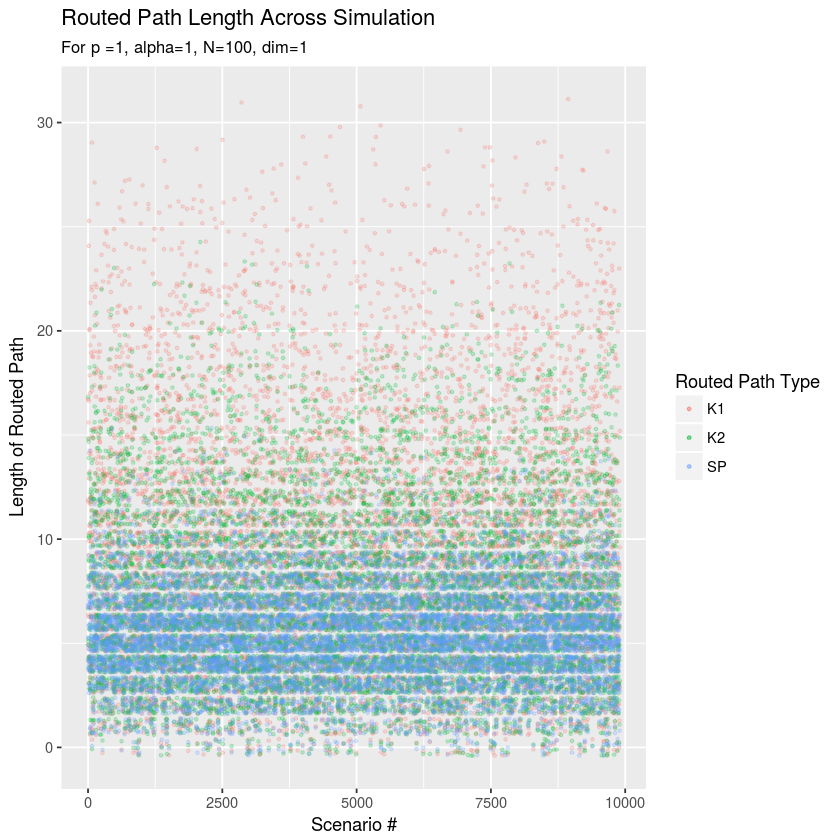

...

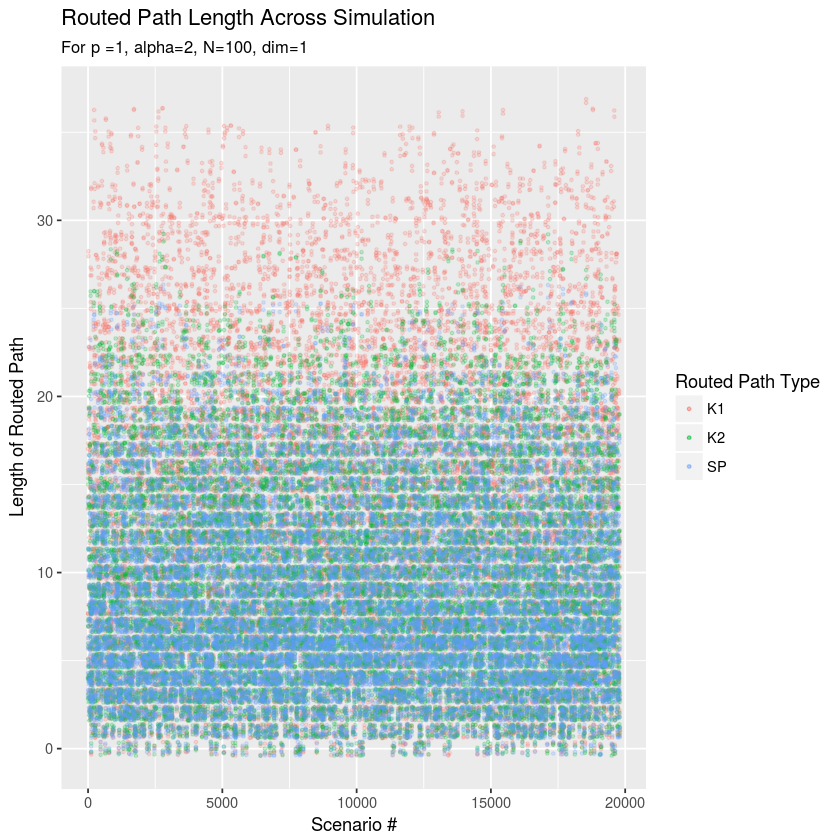

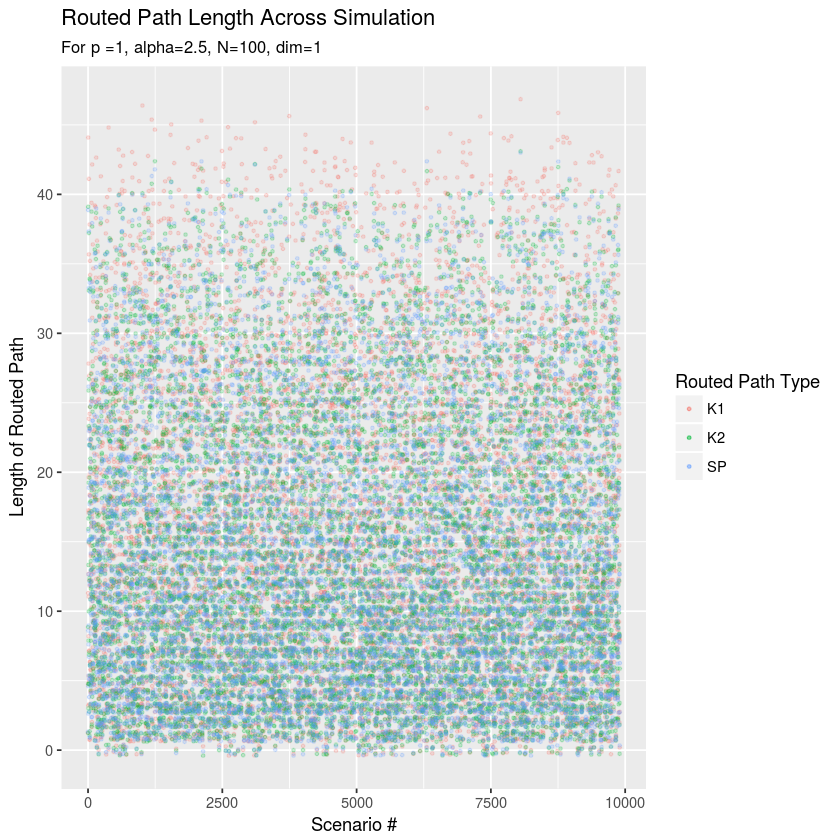

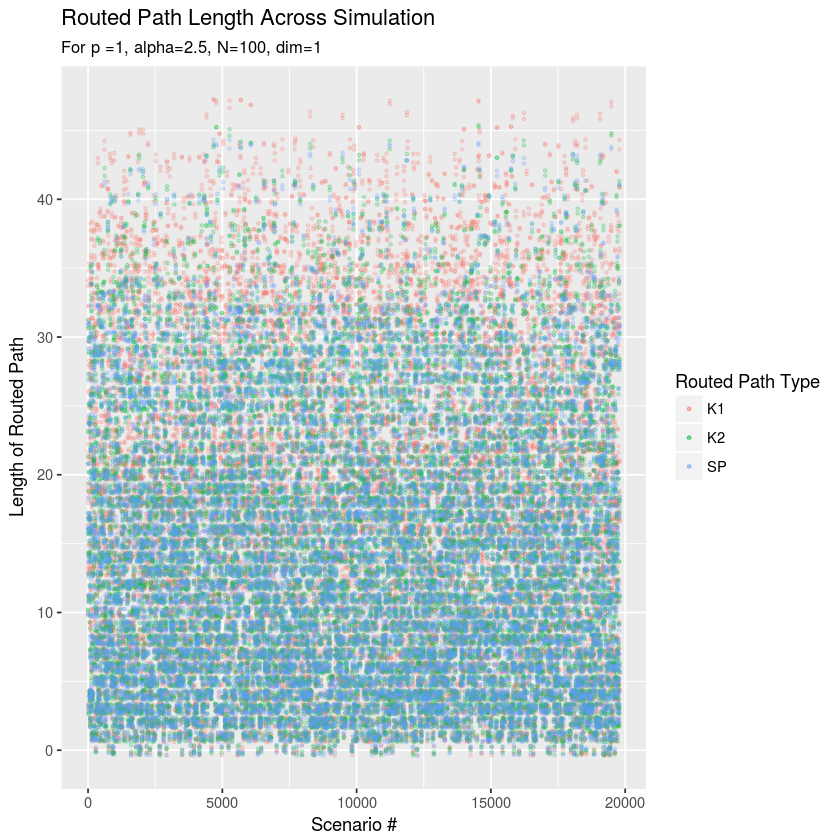

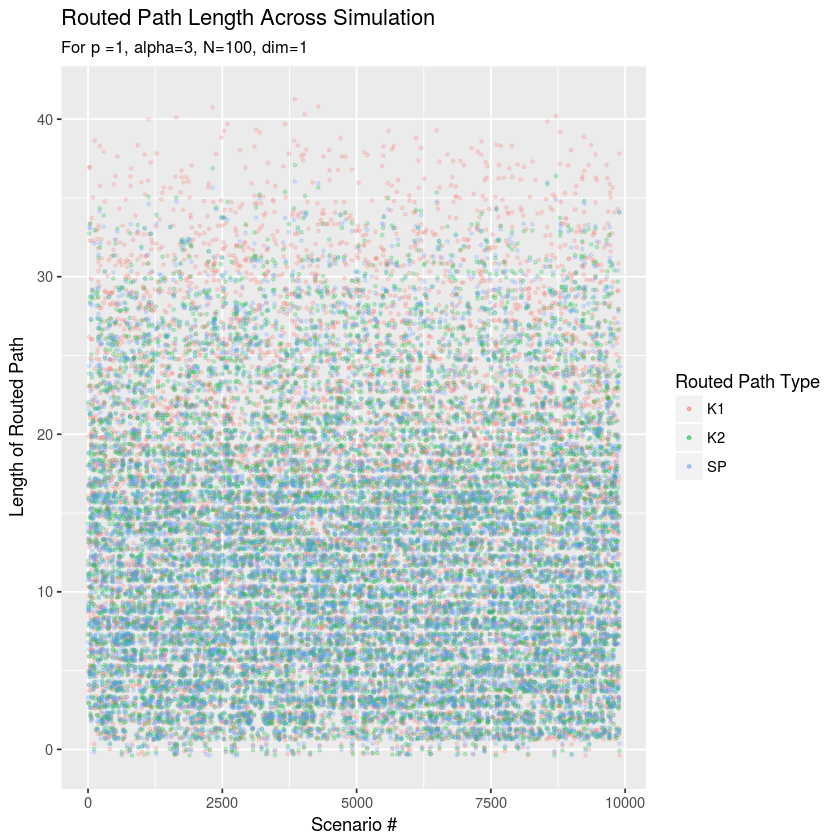

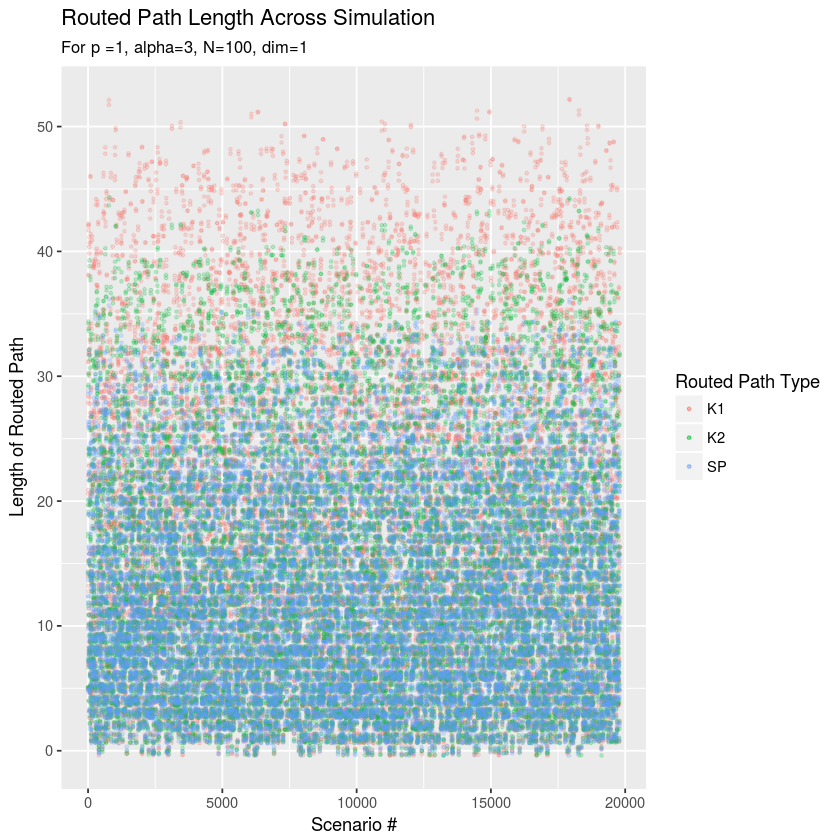

In [15]:
library(ggplot2)
library(readr)

options(warn = -1)

df <- arrange(df, N, alpha)

for (i in 1:length(df$filename)) {
  filename <- df$filename[i]
  p <- df$p[i]
  alpha <- df$alpha[i]
  N <- df$N[i]
  dim <- df$dim[i]
  data <- suppressMessages(read_csv(filename))
  data$seq <- seq_along(data$`lengthOfPathk=1`)
  alphaval <- 0.2
  sizeval  <- 0.7
  print(ggplot(data, aes(x=seq)) +
  geom_point(aes(y=data$`lengthOfPathk=1`, color="K1"), alpha = alphaval, 
             size=sizeval,position=position_jitter()) +  
  geom_point(aes(y=data$`lengthOfPathk=2`, color="K2"), alpha = alphaval,
             size=sizeval,position=position_jitter()) +
  geom_point(aes(y=data$lengthOfShortestPath, color="SP"), alpha = alphaval, 
             size=sizeval,position=position_jitter())+
  labs(x="Scenario #", y="Length of Routed Path",
       color="Routed Path Type",
       title="Routed Path Length Across Simulation",
       subtitle=paste("For p =", p, ", alpha=",alpha,
                      ", N=",N,", dim=",dim, sep="")
       ))
}
rm(alpha, alphaval, dim, filename, i, N, p, sizeval)

### Path Length Count (Aggregated)

The next thing we want to see is the routed path length counts for each of the 
three routing strategies, for given N and alpha values. Those plots are 
shown below. 

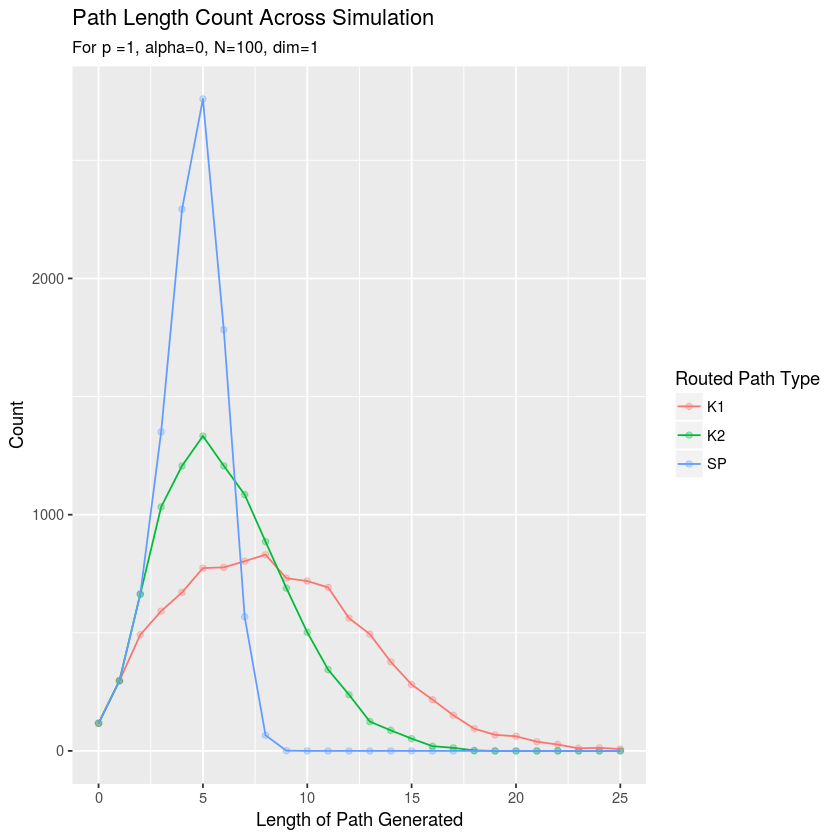

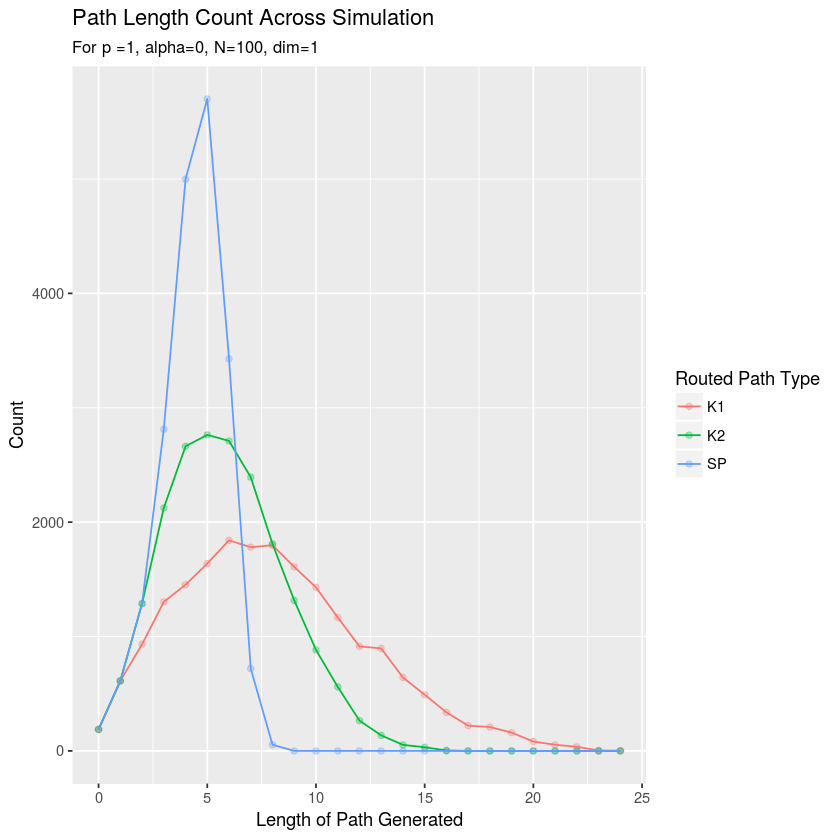

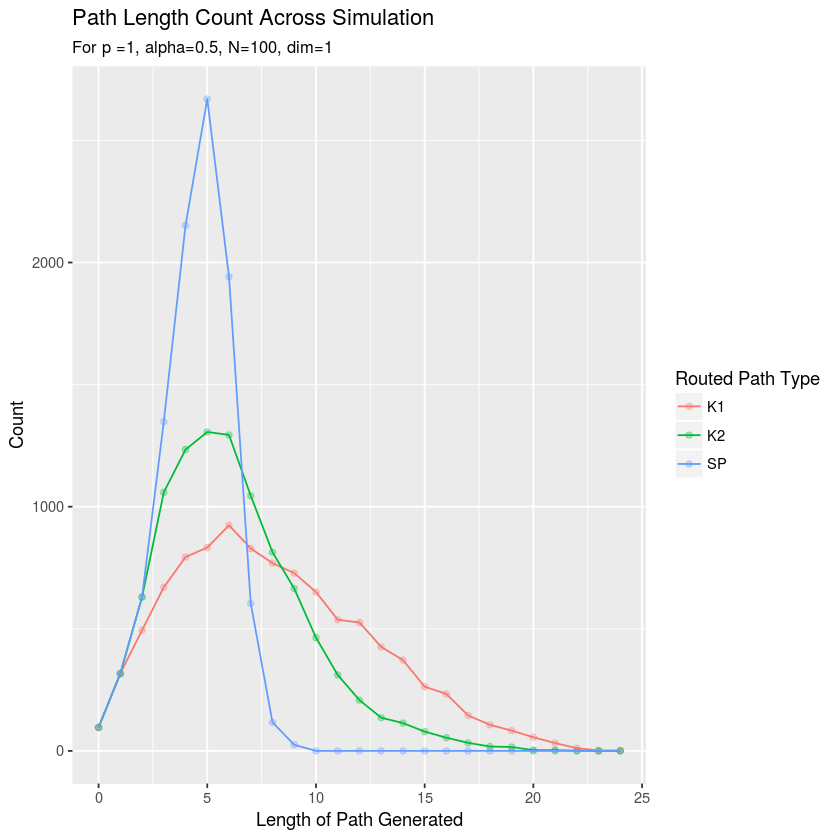

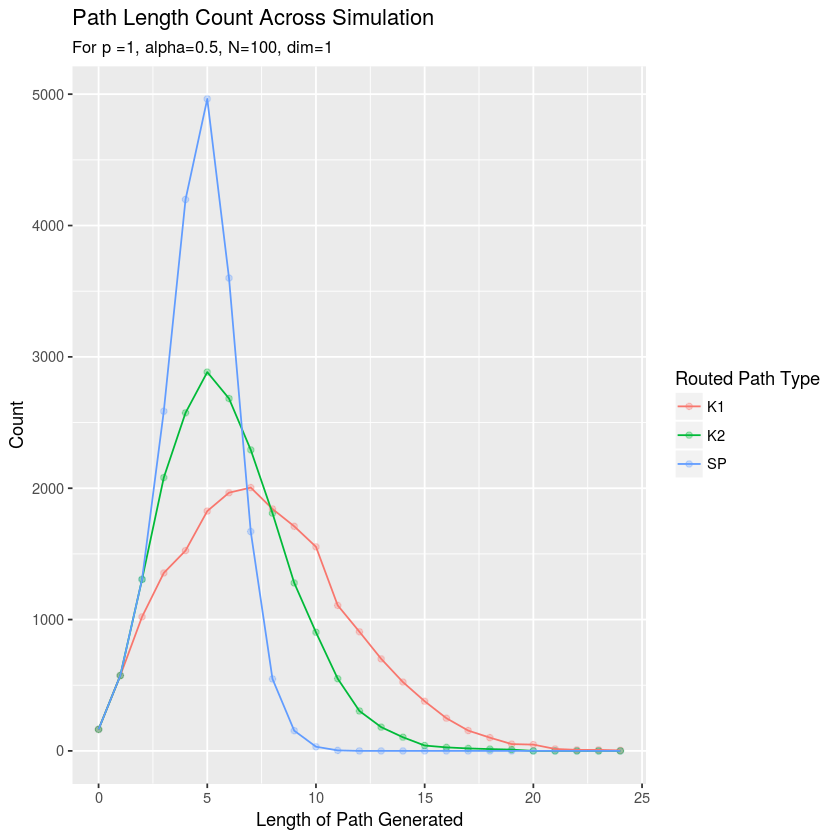

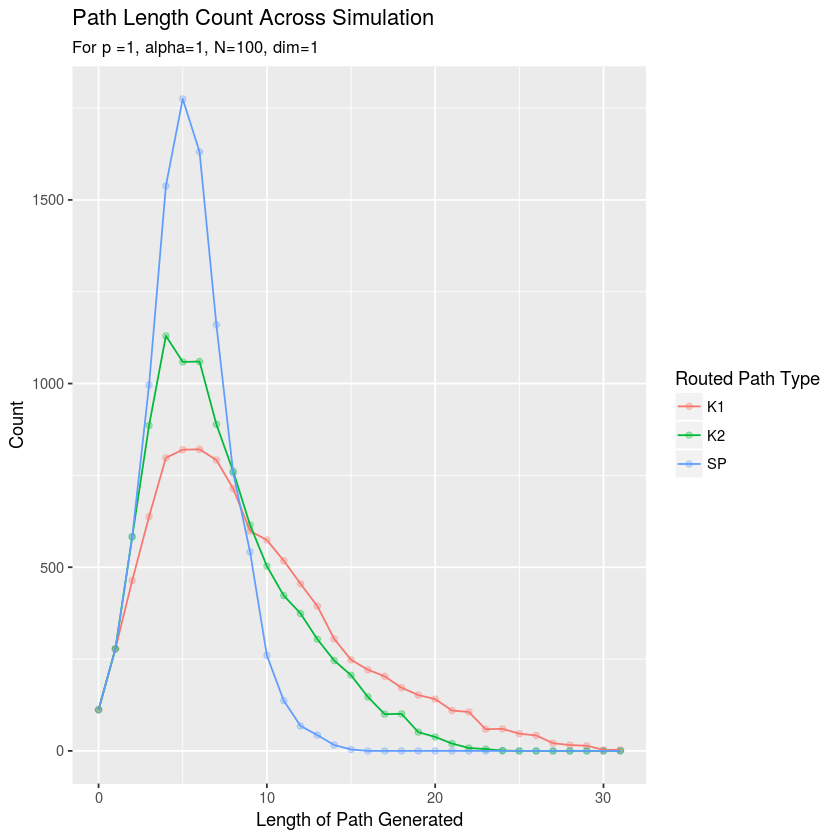

...

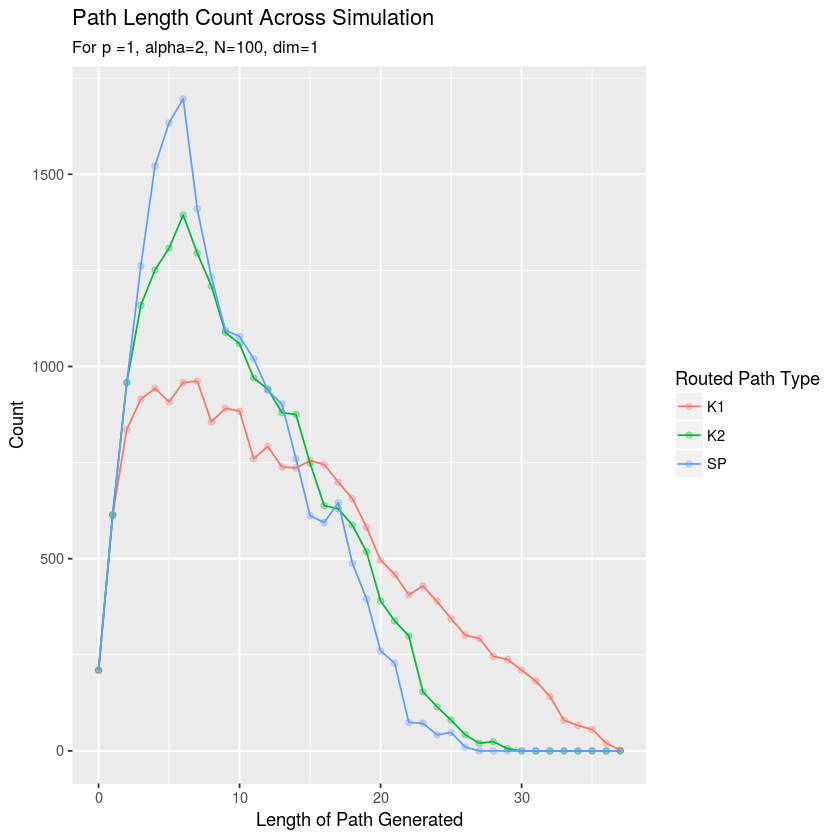

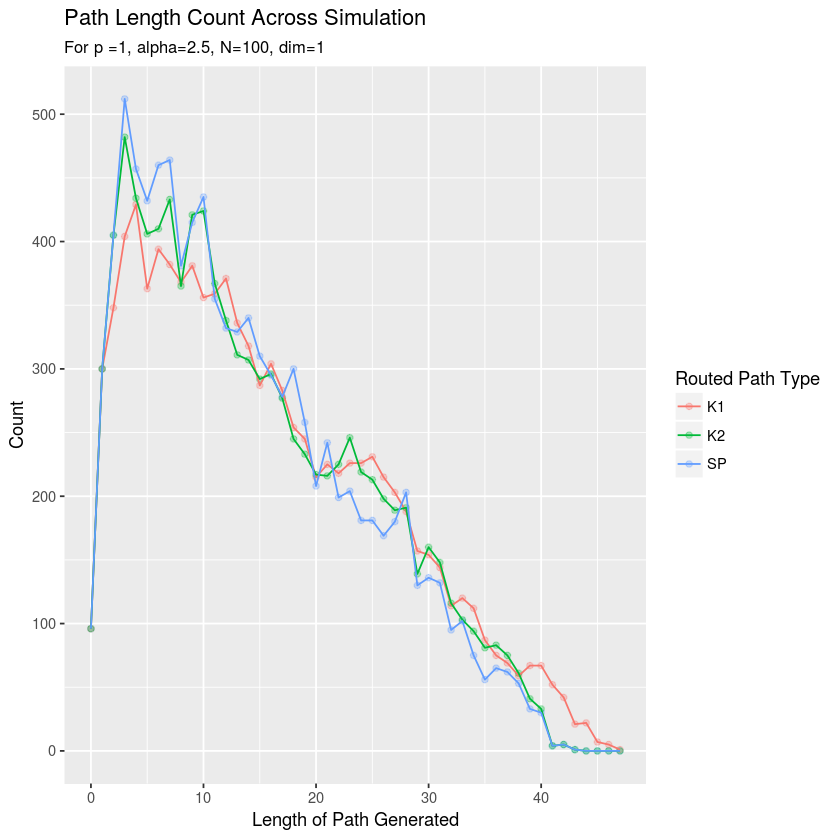

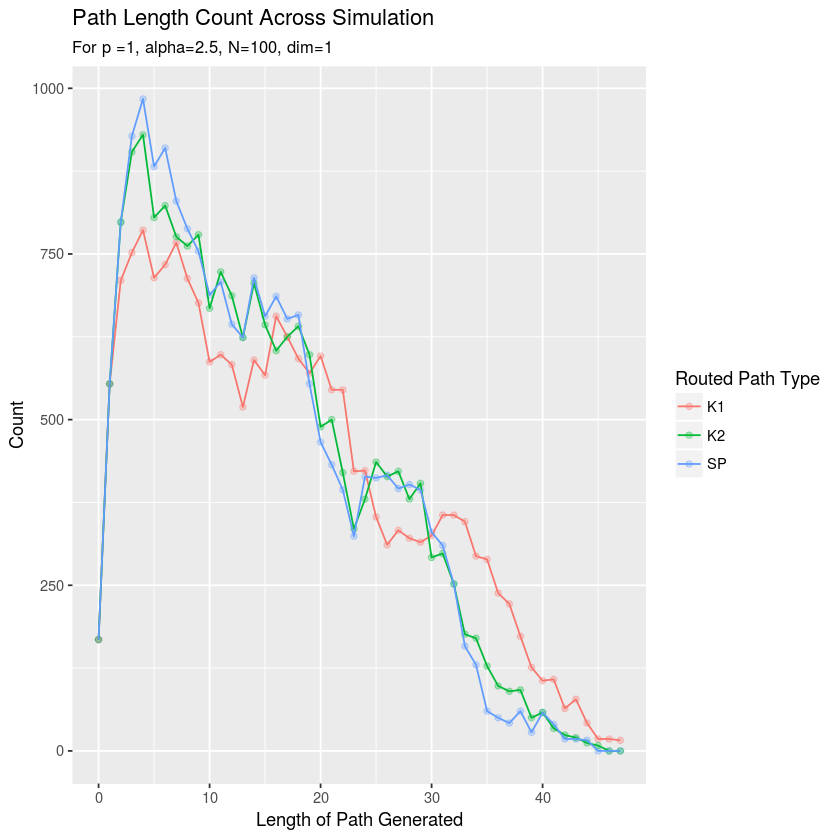

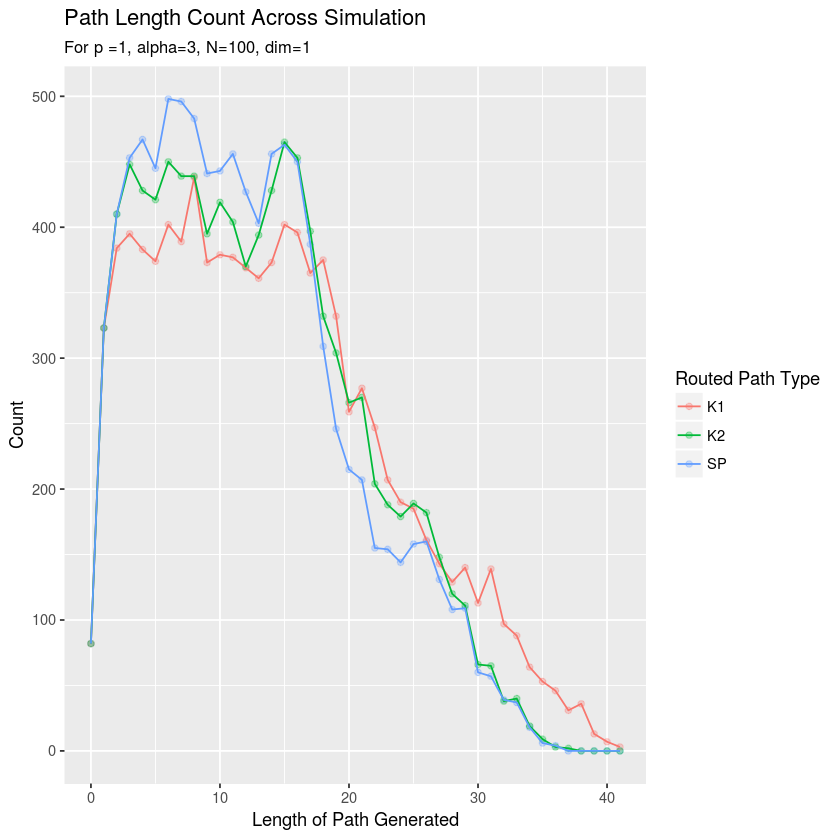

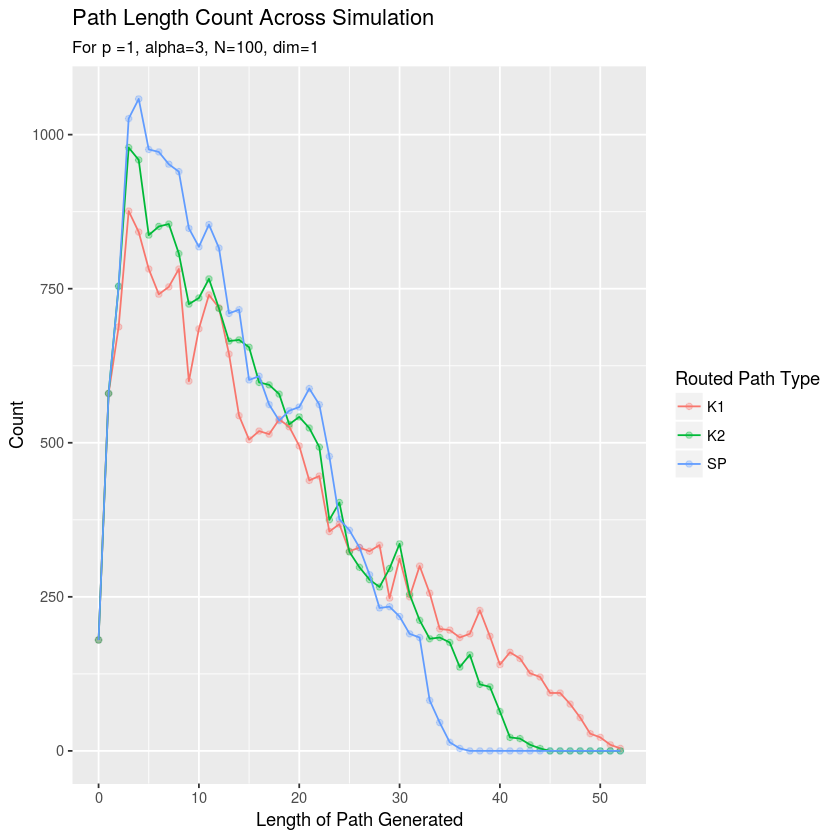

In [16]:
for (i in 1:length(df$filename)) {
  value <- i
  filename <- df$filename[i]
  p <- df$p[i]
  alpha <- df$alpha[i]
  N <- df$N[i]
  dim <- df$dim[i]
  data <- suppressMessages(read_csv(filename))
  data$seq <- seq_along(data$`lengthOfPathk=1`)

numMax <- max(data$lengthOfShortestPath, data$`lengthOfPathk=1`,
              data$`lengthOfPathk=2`)
sp.table <- table(factor(data$lengthOfShortestPath, levels=0:numMax))
sp.table <- as_data_frame(sp.table)
sp.table <- rename(sp.table, count=Var1)
sp.table <- mutate(sp.table, label="SP")

k1.table <- table(factor(data$`lengthOfPathk=1`, levels=0:numMax))
k1.table <- as_data_frame(k1.table)
k1.table <- rename(k1.table, count=Var1)
k1.table <- mutate(k1.table, label="K1")

k2.table <- table(factor(data$`lengthOfPathk=2`, levels=0:numMax))
k2.table <- as_data_frame(k2.table)
k2.table <- rename(k2.table, count=Var1)
k2.table <- mutate(k2.table, label="K2")

total_ds <- rbind(sp.table, k1.table, k2.table)
total_ds$count <- as.numeric(total_ds$count)

print(ggplot(total_ds, aes(y=n, x=count, group=label)) + geom_point(aes(color=label),alpha=0.3) +
        geom_line(aes(color=label)) +
  labs(title="Path Length Count Across Simulation",
       subtitle=paste("For p =", p, ", alpha=",alpha,", N=",N,", dim=",dim, sep=""),
       x="Length of Path Generated",
       y="Count", color="Routed Path Type"))
}
rm(k1.table, k2.table, sp.table, alpha, dim, filename, i, N, numMax, p, value)

Now, you can see that for some of the plots, it gets a bit messy 
(ie alpha=3, N=1000, p=1, dim=1). The code below does that, using 
ggplot's `geom_freqpoly`.

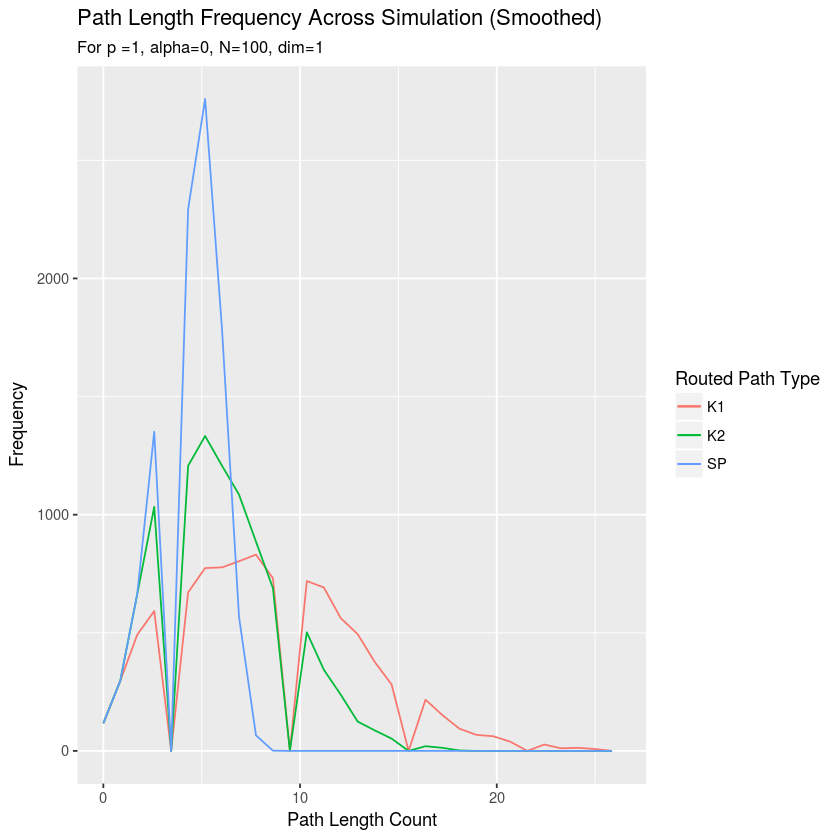

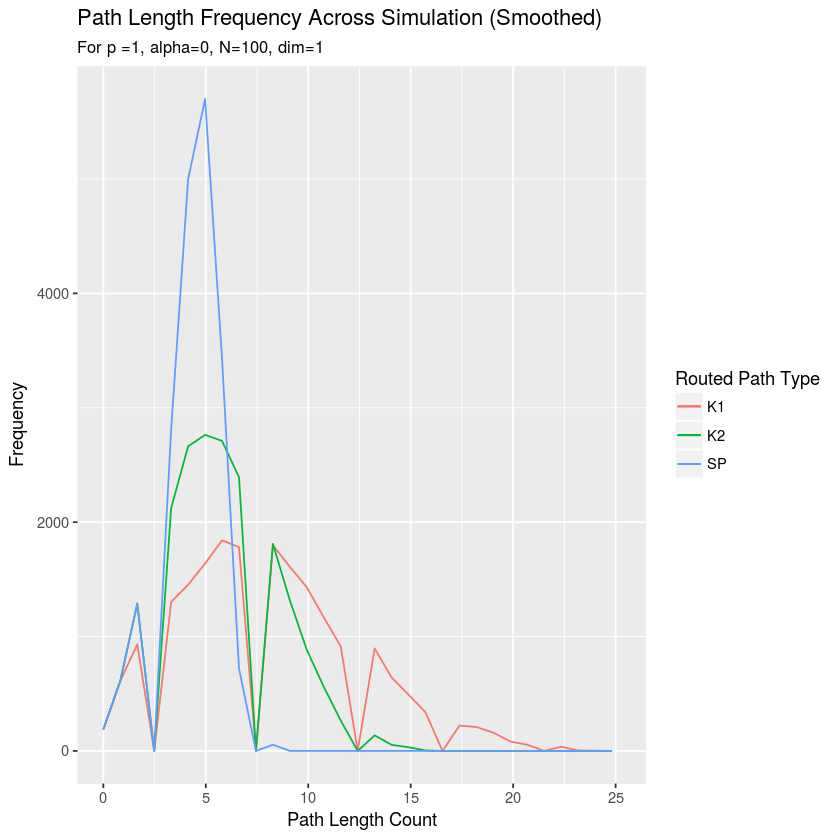

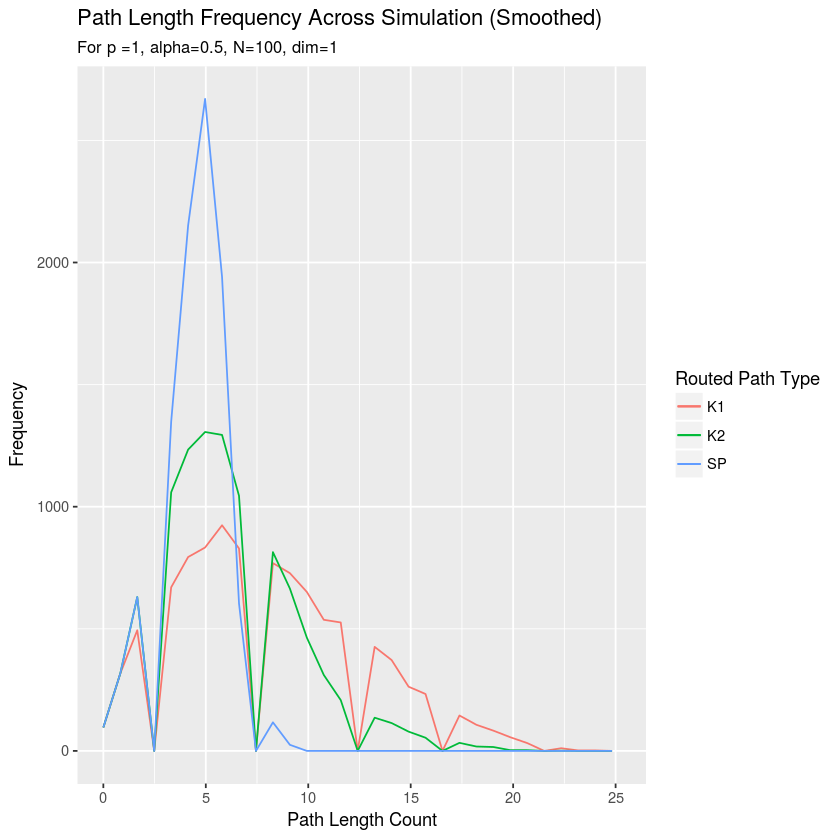

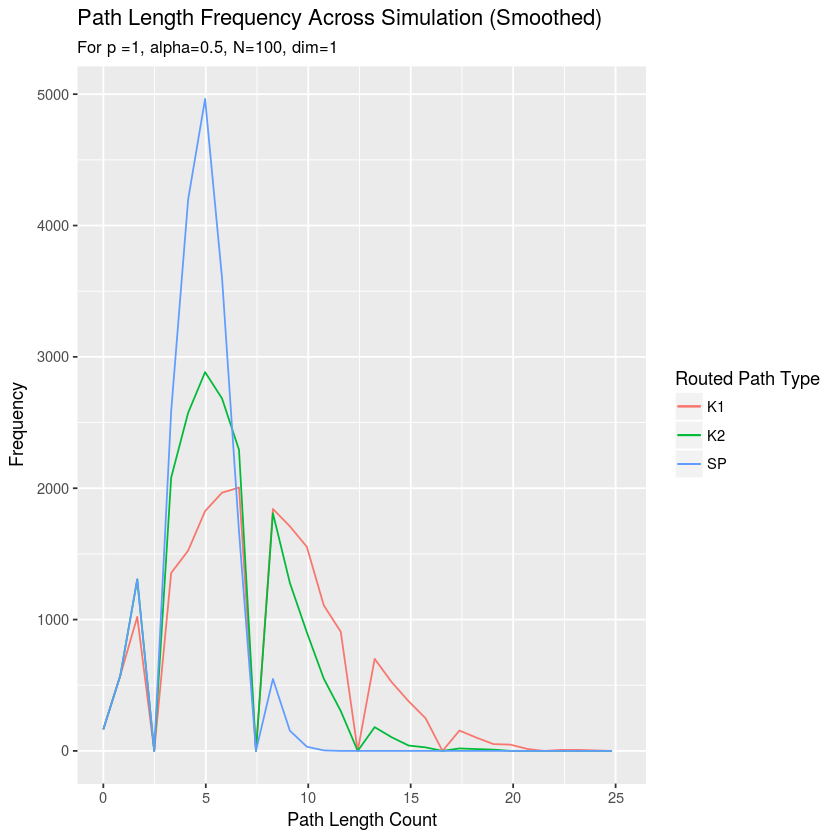

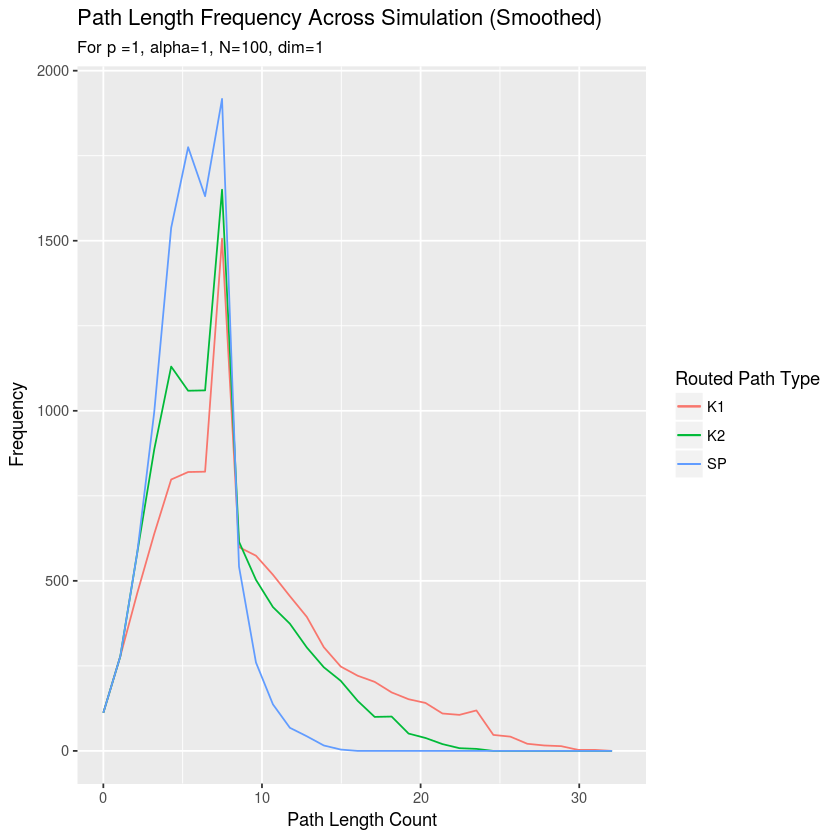

...

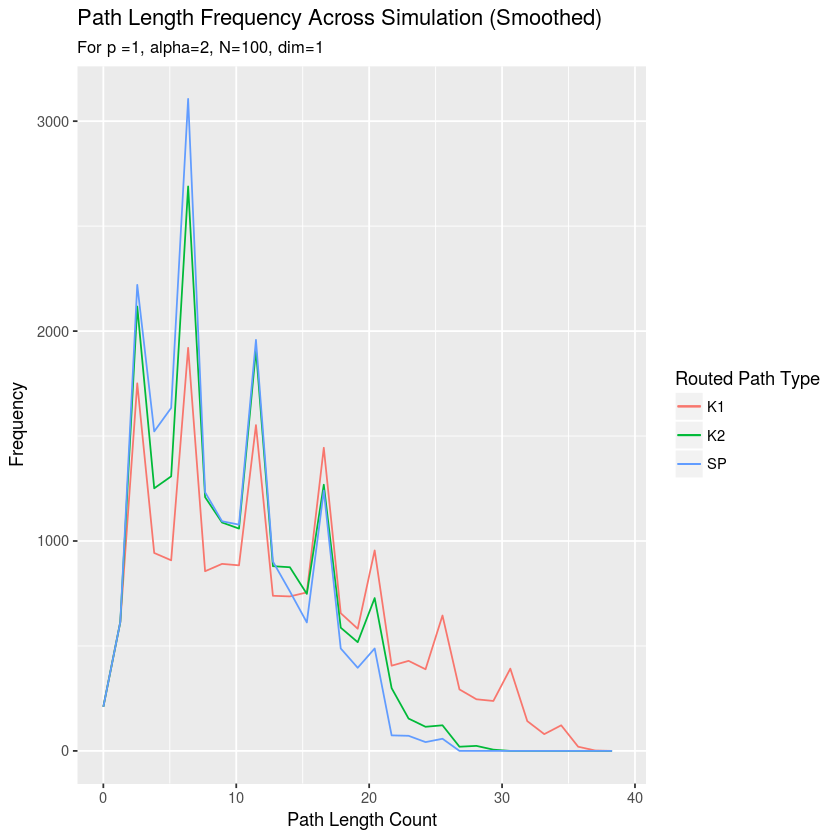

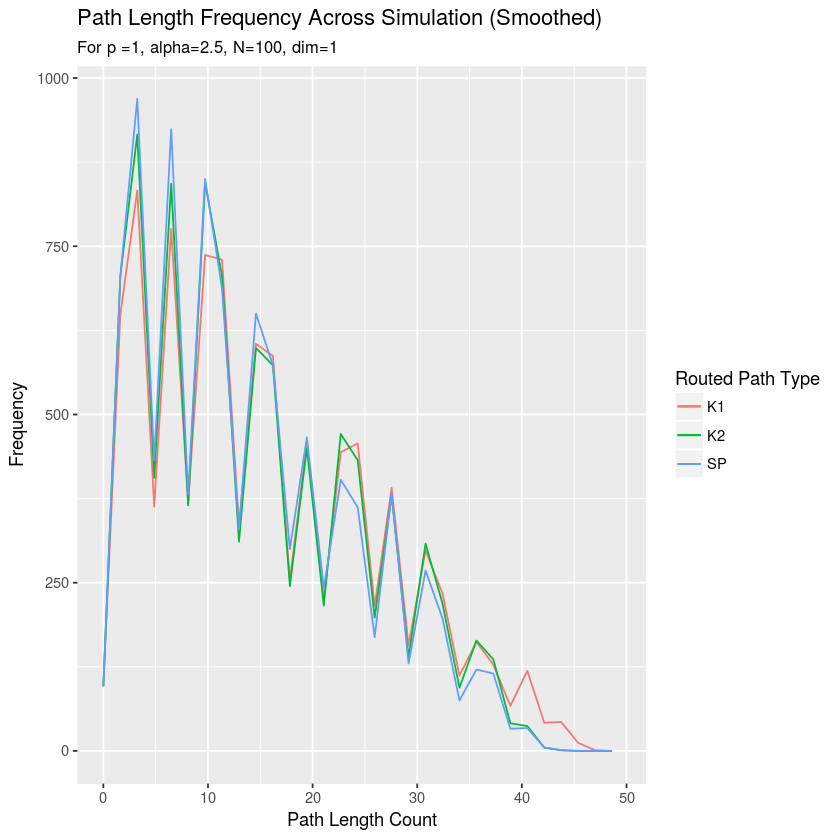

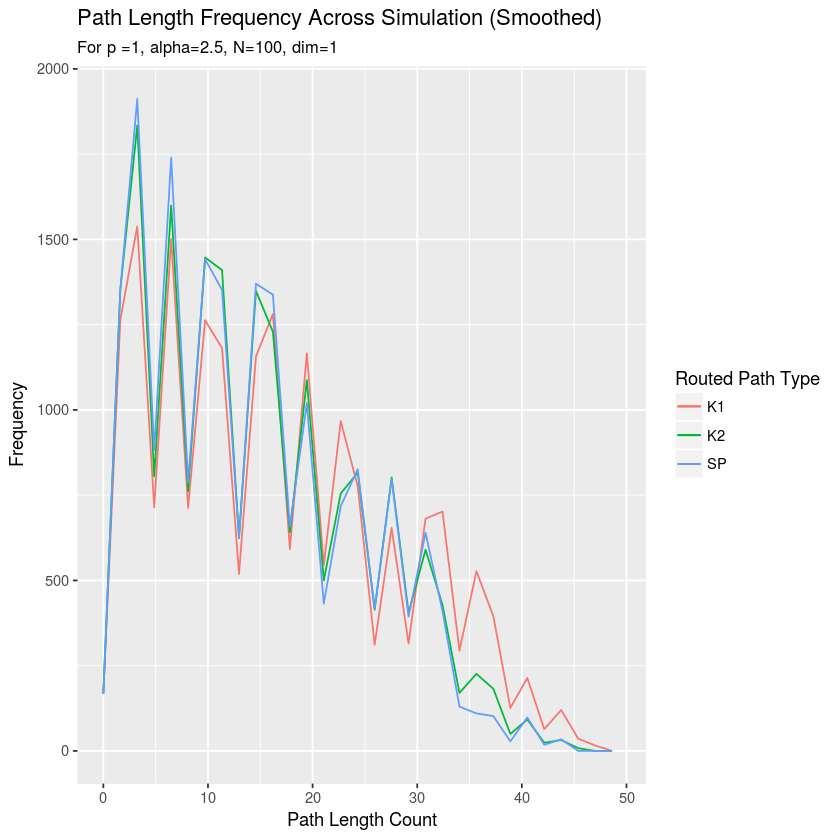

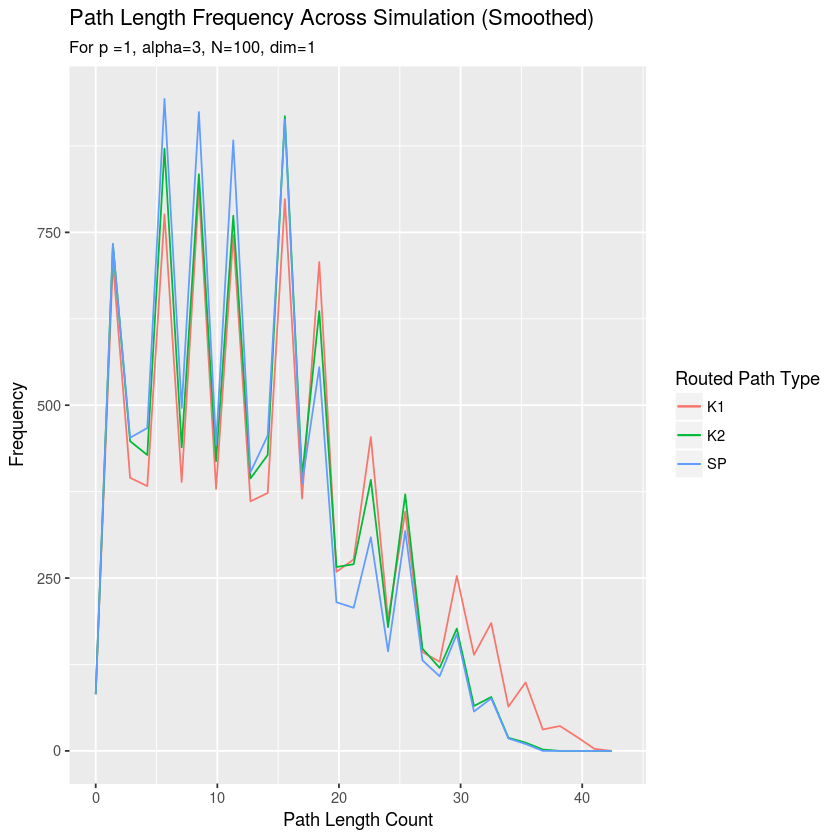

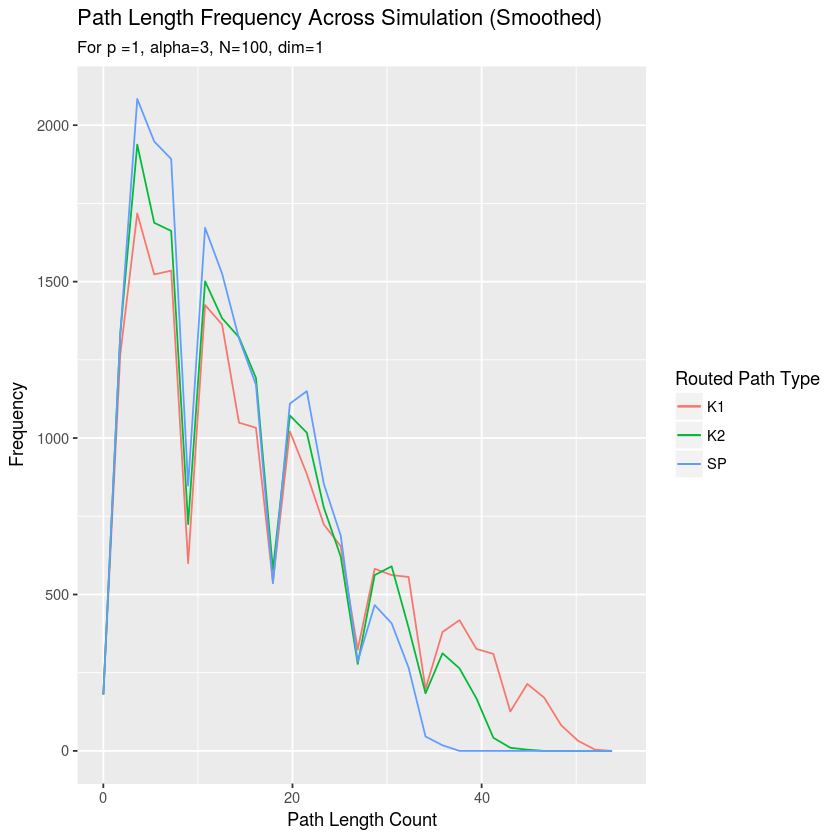

In [17]:
for (i in 1:length(df$filename)) {
  value <- i
  filename <- df$filename[i]
  p <- df$p[i]
  alpha <- df$alpha[i]
  N <- df$N[i]
  dim <- df$dim[i]
  data <- suppressMessages(read_csv(filename))
  data$seq <- seq_along(data$`lengthOfPathk=1`)

zoom <- 30 # Smoothing parameter
  print(ggplot(data, aes(`lengthOfPathk=1`, color="K1")) + geom_freqpoly(bins=zoom) +
  geom_freqpoly(aes(data$`lengthOfPathk=2`, color="K2"), bins=zoom) +
  geom_freqpoly(aes(data$lengthOfShortestPath, color="SP"),bins=zoom) +
  xlab("Path Length Count") + ylab("Frequency") +
  labs(title="Path Length Frequency Across Simulation (Smoothed)",
       subtitle=paste("For p =", p, ", alpha=",alpha,", N=",N,", dim=",dim, sep=""),
       color="Routed Path Type") + xlim(0,NA))
}
rm(alpha, dim, filename, i, N, p, value, zoom)

### Aggregate Measures

Finally, we want to be able to plot the mean generated path length
(and standard deviation) against the alpha value. The code below does that
(and also aggregates other things, in case we want to graph those later).


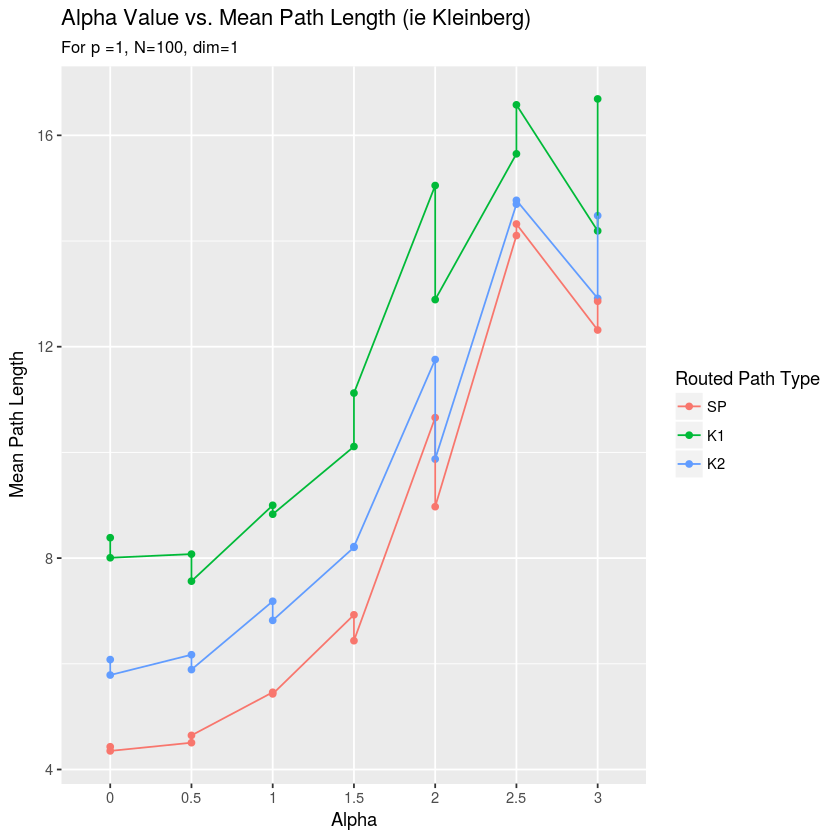

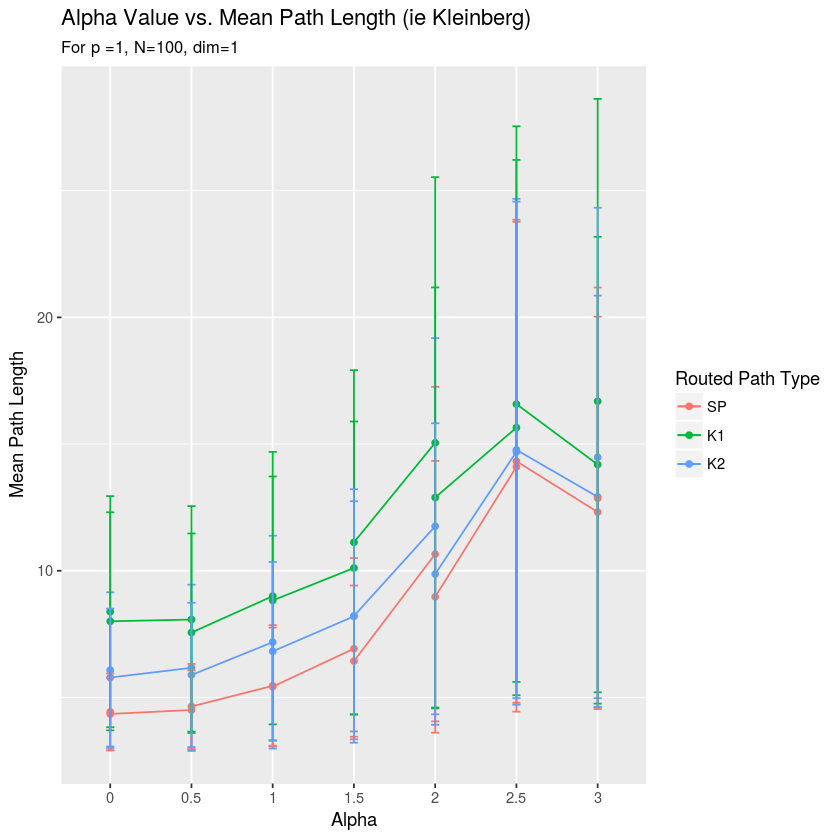

In [18]:
uniquen <- unique(df$N)
for (nval in unique(df$N)) {
  filtereddf <- filter(df, N == nval, dim == 1)
  aggData <- data_frame(
             alpha=numeric(),
             PathMean =numeric(), PathStd =numeric(), PathMedian =numeric(),
             ShortMean=numeric(), ShortStd=numeric(), ShortMedian=numeric(),
             PathType =factor(levels=c("SP","K1","K2"))
             )
  for (i in 1:length(filtereddf$alpha)) {
    alph     <- filtereddf$alpha[i]
    filename <- filtereddf$filename[i]
    rundata  <- suppressMessages(read_csv(filename))
    # Calculates Path-Related Measures
    SPPath.mean  <- mean(rundata$lengthOfShortestPath)
    K1Path.mean  <- mean(rundata$`lengthOfPathk=1`)
    K2Path.mean  <- mean(rundata$`lengthOfPathk=2`)
    SPPath.std   <- sqrt(var(rundata$lengthOfShortestPath))
    K1Path.std   <- sqrt(var(rundata$`lengthOfPathk=1`))
    K2Path.std   <- sqrt(var(rundata$`lengthOfPathk=2`))
    SPPath.median  <- median(rundata$lengthOfShortestPath)
    K1Path.median  <- median(rundata$`lengthOfPathk=1`)
    K2Path.median  <- median(rundata$`lengthOfPathk=2`)
    # Calculates Backstep-Related Measures
    SPBack.mean  <- mean(rundata$backsteps_SP)
    K1Back.mean  <- mean(rundata$`backsteps_k=1`)
    K2Back.mean  <- mean(rundata$`backsteps_k=2`)
    SPBack.std   <- sqrt(var(rundata$backsteps_SP))
    K1Back.std   <- sqrt(var(rundata$`backsteps_k=1`))
    K2Back.std   <- sqrt(var(rundata$`backsteps_k=2`))
    SPBack.median  <- median(rundata$backsteps_SP)
    K1Back.median  <- median(rundata$`backsteps_k=1`)
    K2Back.median  <- median(rundata$`backsteps_k=2`)
    # Calculates Shortcut-Related Measures
    SPShort.mean  <- mean(rundata$shortcutstakenSP)
    K1Short.mean  <- mean(rundata$`shortcutsTakenk=1`)
    K2Short.mean  <- mean(rundata$`shortcutsTakenk=2`)
    SPShort.std   <- sqrt(var(rundata$shortcutstakenSP))
    K1Short.std   <- sqrt(var(rundata$`shortcutsTakenk=1`))
    K2Short.std   <- sqrt(var(rundata$`shortcutsTakenk=2`))
    SPShort.median  <- median(rundata$shortcutstakenSP)
    K1Short.median  <- median(rundata$`shortcutsTakenk=1`)
    K2Short.median  <- median(rundata$`shortcutsTakenk=2`)
    
    # Adds calculated data to the aggData dataframe
    aggData[nrow(aggData)+1,] <- c(
                  alph,
                  SPPath.mean,  SPPath.std,  SPPath.median,
                  SPShort.mean, SPShort.std, SPShort.median,
                  "SP"
                )
    aggData[nrow(aggData)+1,] <- c(
                  alph,
                  K1Path.mean,  K1Path.std,  K1Path.median,
                  K1Short.mean, K1Short.std, K1Short.median,
                  "K1"
                )
    aggData[nrow(aggData)+1,] <- c(
                  alph,
                  K2Path.mean,  K2Path.std,  K2Path.median,
                  K2Short.mean, K2Short.std, K2Short.median,
                  "K2"
                )
  }
  
  aggData$PathMean <- as.numeric(aggData$PathMean)
  aggData$PathStd  <- as.numeric(aggData$PathStd)
  
  print(ggplot(aggData, aes(x=aggData$alpha,y=aggData$PathMean, 
                      color=aggData$PathType, group=aggData$PathType)) +
    geom_point() + geom_line() +
    labs(title="Alpha Value vs. Mean Path Length (ie Kleinberg)",
         subtitle=paste("For p =", 1, ", N=",nval,", dim=",1, sep=""),
         y="Mean Path Length", x="Alpha", color="Routed Path Type")) 
  
  print(ggplot(aggData, aes(x=aggData$alpha,y=aggData$PathMean, 
                      color=aggData$PathType, group=aggData$PathType)) +
    geom_point() + geom_line() +
    geom_errorbar(aes(ymin=aggData$PathMean - aggData$PathStd,
                      ymax=aggData$PathMean + aggData$PathStd,
                      group=aggData$PathType),
                  width=.1) +
    labs(title="Alpha Value vs. Mean Path Length (ie Kleinberg)",
         subtitle=paste("For p =", 1, ", N=",nval,", dim=",1, sep=""),
         y="Mean Path Length", x="Alpha", color="Routed Path Type")) 
}